In [1]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Revise
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/lambda_funcs.jl")

# Some Helpers

In [2]:
function approx_sign(x; tol=1e-13)
    if x > tol
        return 1
    elseif x < -tol
        return -1
    else
        return 0
    end
end

approx_sign (generic function with 1 method)

In [3]:
function explicit_og_bc_vF(delta, alpha, index, vF)
    omega = exp(im * 2 * pi/ 3)
    k = index - 1
    v = vF
    
    nmz = 16 * real(omega^k * delta)^4 + 3 * abs(delta)^4 + 8 * real(delta^3) * real(omega^k * delta)
    
    return ((8 * sqrt(3) / nmz^2) * (8 * v * real(omega^k * delta)^3 - 12 * real(alpha * conj(delta)) * real(omega^k * delta)^2 + 
    3 * abs2(delta) * real(alpha * conj(delta)) + v * real(delta^3)) * (4 * real(omega^k * delta)^2 * imag(alpha * conj(delta)) + 
    4 * real(omega^k * delta) * imag(alpha * delta^2) - v * imag(delta^3) + abs2(delta) * imag(alpha * conj(delta))))
    
end

explicit_og_bc_vF (generic function with 1 method)

In [4]:
function branch1_vF(a, theta, phi, k)
    return (3 * a * cos(theta - phi) * (4 * cos(phi + 2 * pi / 3 * k)^2 - 1) / (8 * cos(phi + 2 * pi / 3 * k)^3 + cos(3 * phi)))
end

branch1_vF (generic function with 1 method)

In [5]:
function branch2_vF(a, theta, phi, k)
    return ((a / sin(3 * phi)) * (4 * cos(phi + 2 * pi / 3 * k)^2 * sin(theta - phi) + 4 * cos(phi + 2 * pi / 3 * k) * sin(theta + 2 * phi) + 
    sin(theta - phi)))
end

branch2_vF (generic function with 1 method)

# Symmetric Potential Phase Diagram

In [6]:
function lambda_og_symm_phases(kappa, sgn)
    vF_llm = 0.00001
    vF_ulm = 1.5
    lambda_llm = 10^(-4)
    lambda_ulm = 5
    fig = Figure(size=(2000, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\text{sgn}(\tilde{\Omega}) \text{ in } (v_F, \lambda) \text{ for } V = V_+", 
    xlabel = L"v_F", ylabel = L"\lambda")
    # plot the analytic phase boundaries
    n_pts = 10^4
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)

    branch_1_vF = []
    branch_1_lambda = []
    branch_2_vF = []
    branch_2_lambda = []
    
    for j in 1:n_pts
        lambda = lambda_list[j]
        delta = sgn * lambda_delta_symm(kappa, lambda)
        alpha = sgn * lambda_alpha_symm(kappa, lambda)

        d = abs(delta)
        phi = wrap_angle(angle(delta))
        a = abs(alpha)
        theta = wrap_angle(angle(alpha))

        # vF does not change the order of eigenvalues
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end

        vF1 = branch1_vF(a, theta, phi, k)
        if vF1 >= vF_llm && vF1 < vF_ulm
            append!(branch_1_vF, vF1)
            append!(branch_1_lambda, lambda)
        end

        vF2 = branch2_vF(a, theta, phi, k)
        if vF2 >= vF_llm && vF2 < vF_ulm
            append!(branch_2_vF, vF2)
            append!(branch_2_lambda, lambda)
        end
    end

    if length(branch_1_vF) > 0
        scatter!(ax1, branch_1_vF, branch_1_lambda, color = :black)
    end
    if length(branch_2_vF) > 0
        scatter!(ax1, branch_2_vF, branch_2_lambda, color = :black)
    end
   
    

    # Plot the numeric phase diagram
    n_pts = 10^2
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)
    vF_list = range(vF_llm + 0.000001, vF_ulm, n_pts)
    grid = mesh_grid(vF_list, lambda_list, Float64)
    pos_points = Point2f[]
    neg_points = Point2f[]
    zero_points = Point2f[]
    for j in 1:n_pts*n_pts
        vF = grid[j, 1]
        lambda = grid[j, 2]
        delta = sgn * lambda_delta_symm(kappa, lambda)
        alpha = sgn * lambda_alpha_symm(kappa, lambda)
        
        phi = wrap_angle(angle(delta))
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end
        # properly enforce
        bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_points, Point2f(vF, lambda))
        elseif bc_sgn > 0
            push!(pos_points, Point2f(vF, lambda))
        else
            push!(zero_points, Point2f(vF, lambda))
        end
    end

    # band crossing
    lines!(ax1, vF_list, 1/kappa * ones(n_pts), color = :black; linestyle = (:dash, :dense), linewidth = 7)

    scatter!(ax1, pos_points, marker = :hexagon, color=(:red, 0.5), markersize=12, label = L"\tilde{\Omega} > 0")
    scatter!(ax1, neg_points, marker = :hexagon, color=(:blue, 0.5), markersize=12, label = L"\tilde{\Omega} < 0")
    scatter!(ax1, zero_points, marker = :hexagon, color=(:black, 0.5), markersize=12, label = L"\tilde{\Omega} = 0")
    fig[1, 2] = Legend(fig, ax1, framevisible = true)
    
    fig
end

lambda_og_symm_phases (generic function with 1 method)

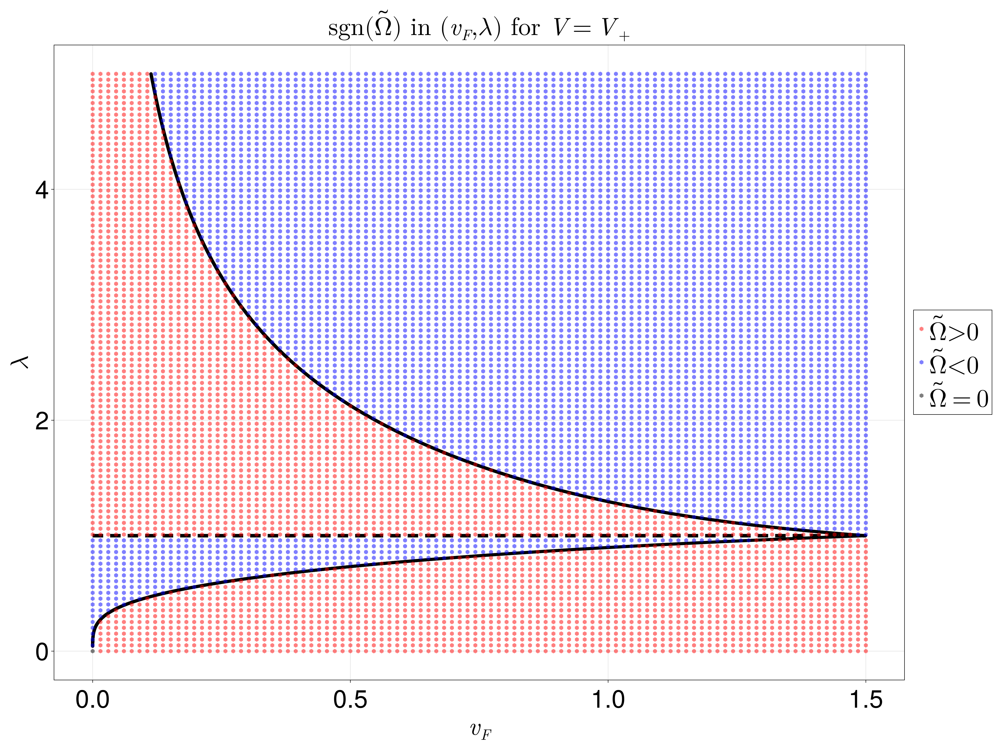

In [100]:
kappa = 1
sgn = -1
lambda_og_symm_phases(kappa, sgn)

# Anti-Symmetric Potential Phase Diagram

In [7]:
function lambda_og_asymm_phases(kappa, sgn)
    vF_llm = 0.00001
    vF_ulm = 5
    lambda_llm = 10^(-4)
    lambda_ulm = 3.5
    fig = Figure(size=(2000, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\text{sgn}(\tilde{\Omega}) \text{ in } (v_F, \lambda) \text{ for } V = V_-", 
    xlabel = L"v_F", ylabel = L"\lambda")
    # plot the analytic phase boundaries
    n_pts = 10^4
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)

    branch_1_vF = []
    branch_1_lambda = []
    branch_2_vF = []
    branch_2_lambda = []
    
    for j in 1:n_pts
        lambda = lambda_list[j]
        delta = sgn * lambda_delta_asymm(kappa, lambda)
        alpha = sgn * lambda_alpha_asymm(kappa, lambda)

        d = abs(delta)
        phi = wrap_angle(angle(delta))
        a = abs(alpha)
        theta = wrap_angle(angle(alpha))

        # vF does not change the order of eigenvalues
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end

        vF1 = branch1_vF(a, theta, phi, k)
        if vF1 >= vF_llm && vF1 < vF_ulm
            append!(branch_1_vF, vF1)
            append!(branch_1_lambda, lambda)
        end

        vF2 = branch2_vF(a, theta, phi, k)
        if vF2 >= vF_llm && vF2 < vF_ulm
            append!(branch_2_vF, vF2)
            append!(branch_2_lambda, lambda)
        end
    end

    if length(branch_1_vF) > 0
        scatter!(ax1, branch_1_vF, branch_1_lambda, color = :black)
    end
    if length(branch_2_vF) > 0
        scatter!(ax1, branch_2_vF, branch_2_lambda, color = :black)
    end
   
    

    # Plot the numeric phase diagram
    n_pts = 10^2
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)
    vF_list = range(vF_llm + 0.000001, vF_ulm, n_pts)
    grid = mesh_grid(vF_list, lambda_list, Float64)
    pos_points = Point2f[]
    neg_points = Point2f[]
    zero_points = Point2f[]
    for j in 1:n_pts*n_pts
        vF = grid[j, 1]
        lambda = grid[j, 2]
        delta = sgn * lambda_delta_asymm(kappa, lambda)
        alpha = sgn * lambda_alpha_asymm(kappa, lambda)
        
        phi = wrap_angle(angle(delta))
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end
        # properly enforce
        bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_points, Point2f(vF, lambda))
        elseif bc_sgn > 0
            push!(pos_points, Point2f(vF, lambda))
        else
            push!(zero_points, Point2f(vF, lambda))
        end
    end

    scatter!(ax1, pos_points, marker = :hexagon, color=(:red, 0.5), markersize=12, label = L"\tilde{\Omega} > 0")
    scatter!(ax1, neg_points, marker = :hexagon, color=(:blue, 0.5), markersize=12, label = L"\tilde{\Omega} < 0")
    scatter!(ax1, zero_points, marker = :hexagon, color=(:black, 0.5), markersize=12, label = L"\tilde{\Omega} = 0")
    fig[1, 2] = Legend(fig, ax1, framevisible = true)
    
    fig
end

lambda_og_asymm_phases (generic function with 1 method)

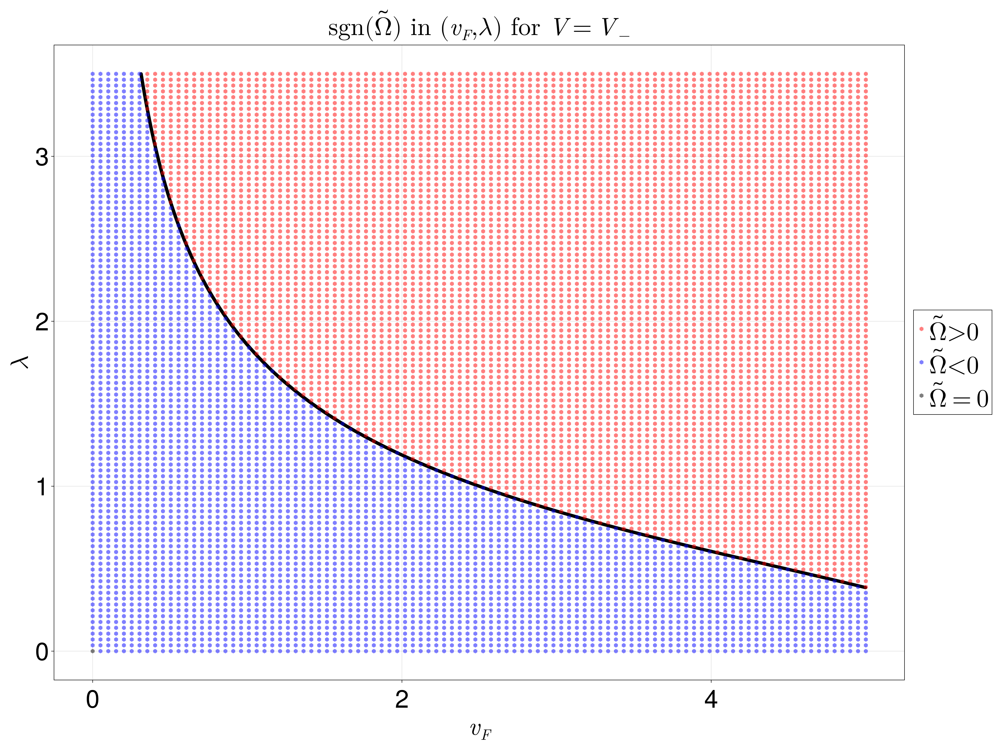

In [8]:
kappa = 1
sgn = -1
lambda_og_asymm_phases(kappa, sgn)

# Phase diagrams using $v_F = \frac{2 \kappa}{r_s^2}$

In [34]:
function lambda_og_symm_phases_rs(kappa, sgn)
    rs_llm = 0.001
    rs_ulm = 25

    lambda_llm = 10^(-4)
    lambda_ulm = 5

    fig = Figure(size=(2000, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\text{sgn}(\tilde{\Omega}) \text{ in } (r_s, \lambda) \text{ for } V = V_+", 
    xlabel = L"r_s", ylabel = L"\lambda")
    # plot the analytic phase boundaries
    n_pts = 10^5
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)

    branch_1_rs = []
    branch_1_lambda = []
    branch_2_rs = []
    branch_2_lambda = []
    
    for j in 1:n_pts
        lambda = lambda_list[j]
        delta = sgn * lambda_delta_symm(kappa, lambda)
        alpha = sgn * lambda_alpha_symm(kappa, lambda)

        d = abs(delta)
        phi = wrap_angle(angle(delta))
        a = abs(alpha)
        theta = wrap_angle(angle(alpha))

        # vF does not change the order of eigenvalues
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end

        
        vF1 = branch1_vF(a, theta, phi, k)
        if vF1 > 0
            rs1 = sqrt(2 * kappa / vF1)
        else
            rs1 = rs_llm - 1
        end
        if rs1 >= rs_llm && rs1 < rs_ulm
            append!(branch_1_rs, rs1)
            append!(branch_1_lambda, lambda)
        end

        vF2 = branch2_vF(a, theta, phi, k)
        if vF2 > 0
            rs2 = sqrt(2 * kappa / vF2)
        else
            rs2 = rs_llm - 1
        end
        if rs2 >= rs_llm && rs2 < rs_ulm
            append!(branch_2_rs, rs2)
            append!(branch_2_lambda, lambda)
        end
    end

    if length(branch_1_rs) > 0
        scatter!(ax1, branch_1_rs, branch_1_lambda, color = :black)
    end
    if length(branch_2_rs) > 0
        scatter!(ax1, branch_2_rs, branch_2_lambda, color = :black)
    end
   
    

    # Plot the numeric phase diagram
    n_pts = 10^2
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)
    rs_list = range(rs_llm + 0.000001, rs_ulm, n_pts)
    grid = mesh_grid(rs_list, lambda_list, Float64)
    pos_points = Point2f[]
    neg_points = Point2f[]
    zero_points = Point2f[]
    for j in 1:n_pts*n_pts
        rs = grid[j, 1]
        vF = 2 * kappa/rs^2
        lambda = grid[j, 2]
        delta = sgn * lambda_delta_symm(kappa, lambda)
        alpha = sgn * lambda_alpha_symm(kappa, lambda)
        
        phi = wrap_angle(angle(delta))
        if 0 <= phi && phi < 2*pi/3
            k = 1
        elseif 2*pi/3 <= phi || phi < -2*pi/3
            k = 0
        elseif phi >= -2*pi/3 && phi <= 0
            k = 2
        end
        # properly enforce
        # bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        bc = lambda_patch_bc(reshape([0, 0], (1, 2)), 10^(-4), lambda, kappa, vF, delta, alpha)[1]
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_points, Point2f(rs, lambda))
        elseif bc_sgn > 0
            push!(pos_points, Point2f(rs, lambda))
        else
            push!(zero_points, Point2f(rs, lambda))
        end
    end

    # band crossing
    lines!(ax1, rs_list, 1/kappa * ones(n_pts), color = :black; linestyle = (:dash, :dense), linewidth = 7)

    scatter!(ax1, pos_points, marker = :hexagon, color=(:red, 0.5), markersize=12, label = L"\tilde{\Omega} > 0")
    scatter!(ax1, neg_points, marker = :hexagon, color=(:blue, 0.5), markersize=12, label = L"\tilde{\Omega} < 0")
    scatter!(ax1, zero_points, marker = :hexagon, color=(:black, 0.5), markersize=12, label = L"\tilde{\Omega} = 0")
    fig[1, 2] = Legend(fig, ax1, framevisible = true)
    
    fig
end

lambda_og_symm_phases_rs (generic function with 1 method)

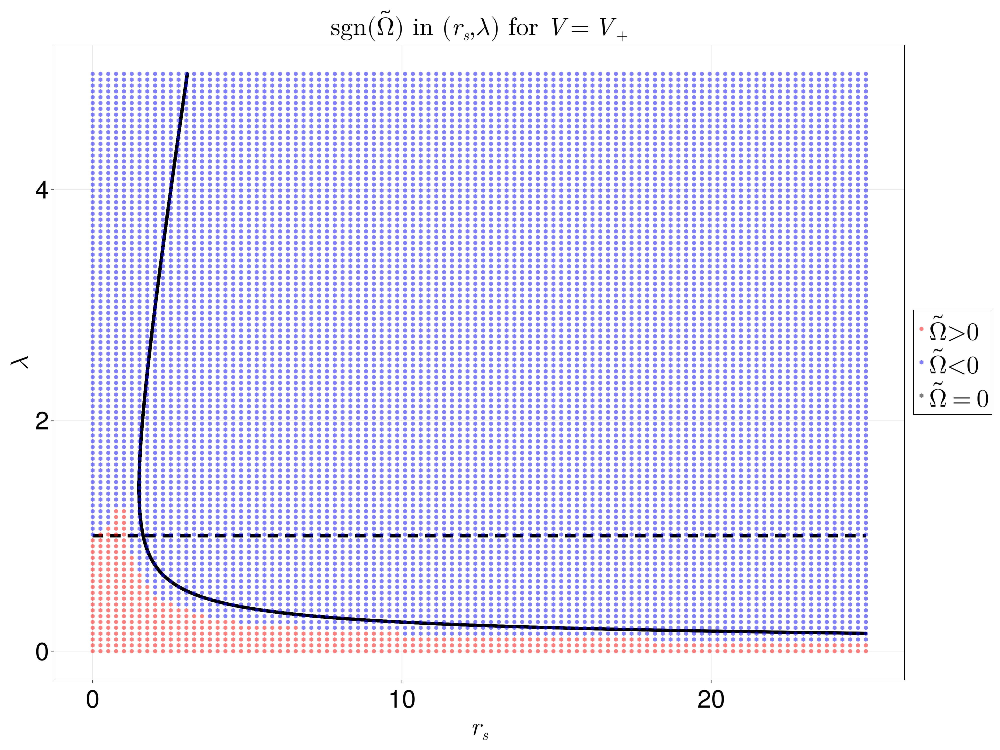

In [35]:
kappa = 1
sgn = 1
lambda_og_symm_phases_rs(kappa, sgn)

In [19]:
function lambda_og_asymm_phases_rs(kappa, sgn)
    rs_llm = 0.001
    rs_ulm = 25

    lambda_llm = 10^(-4)
    lambda_ulm = 5

    fig = Figure(size=(2000, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\text{sgn}(\tilde{\Omega}) \text{ in } (r_s, \lambda) \text{ for } V = -V_-", 
    xlabel = L"r_s", ylabel = L"\lambda")
    # plot the analytic phase boundaries
    n_pts = 10^5
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)

    branch_1_rs = []
    branch_1_lambda = []
    branch_2_rs = []
    branch_2_lambda = []
    
    for j in 1:n_pts
        lambda = lambda_list[j]
        delta = sgn * lambda_delta_asymm(kappa, lambda)
        alpha = sgn * lambda_alpha_asymm(kappa, lambda)

        d = abs(delta)
        phi = wrap_angle(angle(delta))
        a = abs(alpha)
        theta = wrap_angle(angle(alpha))

        # vF does not change the order of eigenvalues
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end

        vF1 = branch1_vF(a, theta, phi, k)
        if vF1 > 0
            rs1 = sqrt(2 * kappa / vF1)
        else
            rs1 = rs_llm - 1
        end
        if rs1 >= rs_llm && rs1 < rs_ulm
            append!(branch_1_rs, rs1)
            append!(branch_1_lambda, lambda)
        end

        vF2 = branch2_vF(a, theta, phi, k)
        if vF2 > 0
            rs2 = sqrt(2 * kappa / vF2)
        else
            rs2 = rs_llm - 1
        end
        if rs2 >= rs_llm && rs2 < rs_ulm
            append!(branch_2_rs, rs2)
            append!(branch_2_lambda, lambda)
        end
    end

    if length(branch_1_rs) > 0
        scatter!(ax1, branch_1_rs, branch_1_lambda, color = :black)
    end
    if length(branch_2_rs) > 0
        scatter!(ax1, branch_2_rs, branch_2_lambda, color = :black)
    end
   
    

    # Plot the numeric phase diagram
    n_pts = 10^2
    lambda_list = range(lambda_llm, lambda_ulm, n_pts)
    rs_list = range(rs_llm + 0.000001, rs_ulm, n_pts)
    grid = mesh_grid(rs_list, lambda_list, Float64)
    pos_points = Point2f[]
    neg_points = Point2f[]
    zero_points = Point2f[]
    for j in 1:n_pts*n_pts
        rs = grid[j, 1]
        vF = 2 * kappa/rs^2
        lambda = grid[j, 2]
        delta = sgn * lambda_delta_asymm(kappa, lambda)
        alpha = sgn * lambda_alpha_asymm(kappa, lambda)
        
        phi = wrap_angle(angle(delta))
        if 0 < phi && phi <= 2*pi/3
            k = 1
        elseif 2*pi/3 < phi || phi <= -2*pi/3
            k = 0
        elseif phi > -2*pi/3 && phi <= 0
            k = 2
        end
        # properly enforce
        bc = explicit_og_bc_vF(delta, alpha/2, k + 1, vF/2)
        # bc = lambda_patch_bc(reshape([0, 0], (1, 2)), 10^(-4), lambda, kappa, vF, delta, alpha)[1]
        bc_sgn = approx_sign(bc)
        if bc_sgn < 0
            push!(neg_points, Point2f(rs, lambda))
        elseif bc_sgn > 0
            push!(pos_points, Point2f(rs, lambda))
        else
            push!(zero_points, Point2f(rs, lambda))
        end
    end

    # band crossing
    # lines!(ax1, rs_list, 1/kappa * ones(n_pts), color = :black; linestyle = (:dash, :dense), linewidth = 7)

    scatter!(ax1, pos_points, marker = :hexagon, color=(:red, 0.5), markersize=12, label = L"\tilde{\Omega} > 0")
    scatter!(ax1, neg_points, marker = :hexagon, color=(:blue, 0.5), markersize=12, label = L"\tilde{\Omega} < 0")
    scatter!(ax1, zero_points, marker = :hexagon, color=(:black, 0.5), markersize=12, label = L"\tilde{\Omega} = 0")
    fig[1, 2] = Legend(fig, ax1, framevisible = true)
    
    fig
end

lambda_og_asymm_phases_rs (generic function with 1 method)

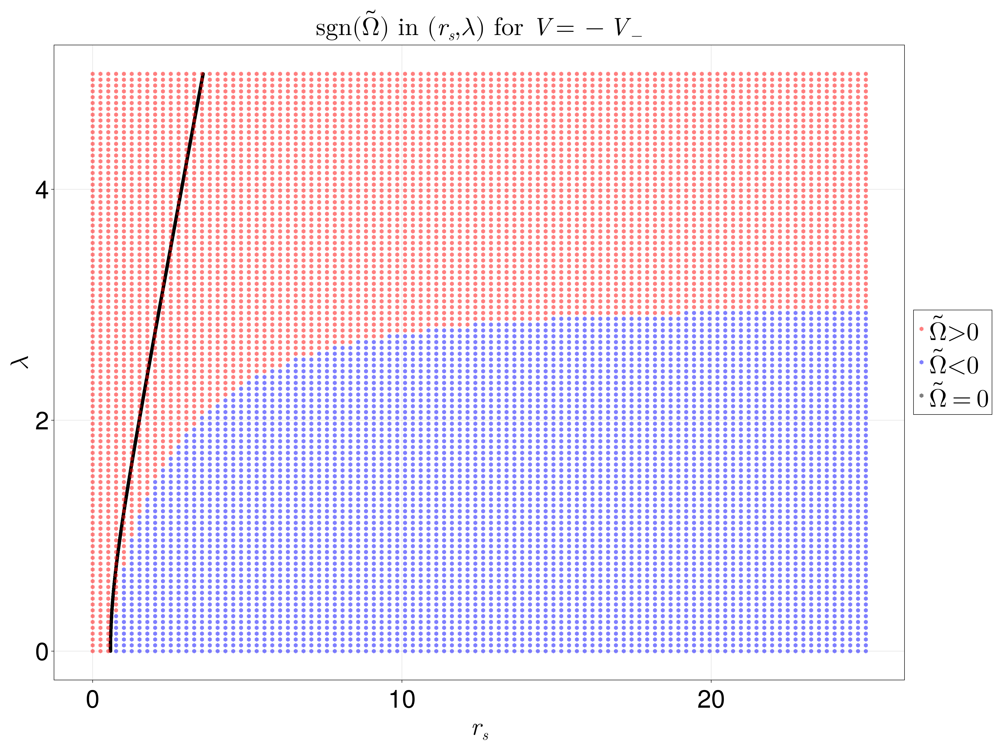

In [22]:
kappa = 1
sgn = -1
lambda_og_asymm_phases_rs(kappa, sgn)